## Домашнее задание 3 (10 баллов)

## НИУ ВШЭ, 2024-25 учебный год

## Формат сдачи

Сам ноутбук называйте в формате hw-03-USERNAME.ipynb, где USERNAME — ваши фамилия и имя. Файл надо будет сдать в anytask.

## О задании

В этом домашнем задании вы получите опыт подготовки данных и EDA (Exploratory Data Analysis), приблизившись к реальной работе с данными с помощью уже знакомых вам инструментов: numpy, pandas, matplotlib и seaborn, а также познакомитесь с plotly.

EDA - важный этап работы с данными. Именно в процессе EDA вы можете выяснить особенности датасета, найти зависимости в данных, протестировать гипотезы о взаимосвязях признаков и целевой переменной. В реальности вы сами будете определять, что и как проверять в рамках EDA, однако в данной работе гипотезы будут выдвинуты за вас автором задания. Также и типы графиков, которые вы будете использовать уже предопределены за вас. Выполняя задания по визуализациям, обращайте внимание на референсные картинки, которые были оставлены авторами. Они показывают, какой примерно результат от вас ожидается.

Это задание будет включать в себя построение некоторого количества графиков, потому вот основные правила, в соответствии с которыми графики должны быть оформлены:
1. Любой график всегда имеет название.
2. Оси у графика подписаны (исключение - график делит название оси с соседним).
3. Подписи делаются на одном языке (либо английский, либо русский), но не на их смеси.
4. Если вы выводите несколько графиков, то они размещаются в рамках одного объекта matplotlib.pyplot.figure. Вы не выводите графики последовательно, а смотрите, как их разместить сразу все за раз.
5. Отдельные графики (если графиков на картинке больше 1) также имеют свои названия.
6. Если на графике есть несколько различных объектов, то для их различения используется легенда. Помещайте легенду в место, где она в наименьшей мере мешает восприятию самого графика.
7. Если есть легенда, то она должна иметь навание, а также ее содержание должно быть адекватными (пожалейте проверяющих, они не хотят разбирать, а к чему относится зеленая линия, которая на легенде помечена меткой "0").
8. Используйте цветовые гаммы, чтобы объекты на графиках отличались цветом.
9. Текст на визуализации должен быть читаем. Если вы вывели названия категорий в качестве подписей на оси Х, а эти названия наезжают друг на друга, то вам нужно что-то с этим сделать. Нечитаемый или плохо читаемый (очень маленький, невероятно огромный) текст ведет к снижению баллов.

При работе с табличными данными используйте функционал [style](https://pandas.pydata.org/docs/user_guide/style.html#Builtin-Styles), чтобы визуально выделять необходимые элементы.

В этом задании будут оцениваться ваши развернутые комментарии, размышления и выводы (по построенным графикам): не скупитесь на них, но следите, чтобы выводы не были поверхностными и очевидными.

*Тут правило про плагиат, которое вам итак известно - обнуляются все работы, которые подозреваются в некорректных заимствованиях!* Помните, что просто скопировать код из интернета и указать источник - это не ваша самостоятельная работа, а автора кода. Измените хоть что-нибудь в коде.

## О данных

Будем работать с [датасетом физической активности](https://www.kaggle.com/datasets/uciml/human-activity-recognition-with-smartphones).

В этом датасете собраны данные 30 человек, выполняющих различные действия со смартфоном на поясе. Данные записывались с помощью датчиков (акселерометра и гироскопа) в этом смартфоне. Были зафиксированы: "3-осевое линейное ускорение" (_tAcc-XYZ_) и "3-осевая угловая скорость" (_tGyro-XYZ_).

1. Все сигналы отсортированы по времени, пропущены через фильтр шума.
2. Все наблюдения были разделены на окна по 128 сигналов в каждом, причем окна пересекаются на 50% (грубо говоря, с 1 по 128 сигнал в 1 окно, с 64 до 192 сигнала - во 2 окно и так далее). То есть каждое окно покрывает 2.56 секунды данных (два шага человека при ходьбе, учитывая медленную походку пожилых людей).
3. Линейное ускорение было разделено на две составляющие (с помощью низкочастотного фильтра): ускорение самого тела, а также гравитационная составляющая. Будем называть их ускорением тела и гравитационным ускорением.
4. К получившимся окнам применяли различные функции для получения следующих показателей:
    - max
    - min
    - mad (median)
    - mean
    - std
    - skewness (коэффициент асимметричности распределения признака в окне)
    - etc. (подробнее, на сколько это возможно, указано в [самой статье](https://www.esann.org/sites/default/files/proceedings/legacy/es2013-84.pdf))
5. Величина (magnitude) сигнала также определялась через евклидову норму всех значений из вектора для одного окна.
6. К окнам было применено преобразование Фурье, чтобы получить частоты. Из частот были извелченыте же показатели, плюс новые:
    - bandsEnergy (энергия частотного интервала)
7. Были посчитаны углы между векторами соответствующих окон.
8. Для ускорений были посчитаны производные - рывки, к которым применялись те же функции.

Итог: в датасете каждый признак - это какая-то операция над вектором из 128 чисел, которые соответствуют замерам определенного человека занятого какой-то активностью на протяжении 2.56 секунд.

Как читать названия признаков? Примеры:
- `tBodyAccMag-mean()` - это вектор ускорений тела (без гравитационной составляющей этого ускорения), из которого взяли евклидову норму, а затем усреднили, чтобы получить скаляр
- `fBodyAcc-bandsEnergy()-1,8.2` - это вектор ускорения тела, к которому применили преобразование Фурье, преобразовав его в вектор частот, а затем посчитали на этом векторе энергию данного частотного интервала в определенном диапазоне частот (в данном случае 1 - 8.2)
- `angle(X,gravityMean)` - это угол между осью Х и вектором усредненных значений гравитационного ускорения из соответствующего окна

Вероятно, сначала покажется сложным, но мы разберемся с некоторыми признаками в отдельности и вы сможете понять их смысл, уже исходя из фактических соотношений.

## Предобработка данных

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [3]:
train = pd.read_csv('train.csv')
test = pd.read_csv("test.csv")

In [4]:
train.shape

(7352, 563)

В датасете 563 признака, включая целевую переменную. Столько признаков нам не нужно. Мы за вас сделали подвыборку признаков для удобства работы с ними.

In [5]:
cols_subset = [
    'tBodyAccMag-mean()',  # усредненная величина ускорения тела
    'tBodyGyroJerk-mad()-X',  # медианная величина рывка тела по оси Х
    'tGravityAcc-min()-X',  # минимум гравитационной составляющей ускорения по оси Х
    'tBodyAcc-max()-X',  # максимальная величина ускорения тела по оси Х
    'fBodyAcc-bandsEnergy()-1,8.2',  # энергия ускорения тела в интервале частоты
    'angle(X,gravityMean)',  # угол между осью Х и усредненной гравитационной составляющей ускорения
    'angle(Y,gravityMean)',  # угол между осью Y и усредненной гравитационной составляющей ускорения
    'angle(Z,gravityMean)',  # угол между осью Z и усредненной гравитационной составляющей ускорения,
    'fBodyAcc-skewness()-X',  # асимметричность частоты ускорения тела по оси Х
    'subject',  # номер испытуемого
    'Activity',  # название вида деятельности (целевая переменная)
]

In [6]:
train = train[cols_subset]
test = test[cols_subset]

### Задание 1 (0.5 балла)

Посмотрите на пропуски и дубли в данных train и test. Есть ли они? Если есть, напишите, с чем это может быть связано? Если нет, то просто напишите, что пропусков и/или дублей нет.

In [173]:
# ٩(◕‿◕｡)۶ your code here

missing_values_train = train.isnull().sum().sum()
missing_values_test = test.isnull().sum().sum()

duplicates_train = train.duplicated().sum()
duplicates_test = test.duplicated().sum()

print(f"Пропуски в train: {missing_values_train}")
print(f"Пропуски в test: {missing_values_test}")
print(f"Дубли в train: {duplicates_train}")
print(f"Дубли в test: {duplicates_test}")

# видим, что пропусков и дубликатов в тренировочной и тестовой выборках нет. Нам повезло! 
# Нам предоставили качественно предобработанные данные либо же это хороший эксперимент
# так как данные собирались с устройств, это очень вероятно.)



Пропуски в train: 0
Пропуски в test: 0
Дубли в train: 0
Дубли в test: 0


### Задание 2 (0.5 балла)

Выведите основные статистики данных: среднее, медиана, перцентили (0.25, 0.5, 0.75), минимум, максимум, стандартное отклонение. Посмотрите на таблицу и напишите, видите ли вы в ней что-нибудь интересное.

In [174]:
# (ノಠ益ಠ)ノ彡 your code here
info_train = train.describe()
info_test = test.describe()
display(info_train)
display(info_test)


# видно, что данные нормализированы, выбросов нет, так как везде мнимум -1, а максимум - 1 
# (кроме целевого столбца subject, но в нем тоже значения без выбросов от 1 до 30).
# Интересно было увидеть, что в test диапазон от 2 до 24. Это значит, что в train данные более полные, что вообще супер!

# Также есть небольшая скошенность (или асимметрия) распределений
# fBodyAcc-skewness()-X – коэффициент асимметрии частоты ускорения:
# В train [-0.93, 1.0], в test [-1.0, 0.96]
# Среднее значение отрицательное и в train, и в test (-0.12 и -0.15).
# Это значит, что распределение этого признака смещено влево. То есть, больше низких значений.

# Но мы не увидели самое главное - колонку Activity! Целевую переменную!! 
# А все потому что в ней не числовые данные и describe её проигнорировал. (
# Для этого можем посмотреть на неё отдельно или передать в describe параметром include="all", но я посмотрю отдельно

display(train["Activity"].describe())

# Тут мы понимаем, что число разных действий/поз - 6. Самая частая поза - лёжа, которая повторилась 1407 раз. 

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject
count,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000
mean,-0.543884,-0.727735,0.678505,-0.468604,-0.847963,-0.489547,0.058593,-0.056515,-0.128562,17.413085
std,0.477653,0.315832,0.508656,0.544547,0.233633,0.511807,0.297480,0.279122,0.403686,8.975143
min,-1.000000,-0.999889,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.931208,1.000000
25%,-0.983282,-0.991595,0.804270,-0.936219,-0.999480,-0.812065,-0.017885,-0.143414,-0.486841,8.000000
50%,-0.883371,-0.950268,0.926693,-0.881637,-0.986582,-0.709417,0.182071,0.003181,-0.163271,19.000000
75%,-0.106892,-0.474625,0.965095,-0.017129,-0.764508,-0.509079,0.248353,0.107659,0.155112,26.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.478157,1.000000,1.000000,30.000000


,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject
count,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000,2947.000000
mean,-0.559043,-0.735661,0.696878,-0.462063,-0.880361,-0.513923,0.074886,-0.048720,-0.154042,12.986427
std,0.439539,0.282074,0.502873,0.523916,0.160496,0.509205,0.324300,0.241467,0.392203,6.950984
min,-0.998936,-1.000000,-0.756774,-0.952357,-0.999989,-0.984195,-0.913704,-0.949228,-1.000000,2.000000
25%,-0.978433,-0.989078,0.836787,-0.934447,-0.999330,-0.829722,0.022140,-0.098485,-0.497070,9.000000
50%,-0.861830,-0.914698,0.934930,-0.852659,-0.979336,-0.729648,0.181563,-0.010671,-0.202050,12.000000
75%,-0.149596,-0.486423,0.970871,-0.009965,-0.799113,-0.545939,0.260252,0.092373,0.140254,18.000000
max,0.479547,0.117606,0.996148,0.786436,0.048730,0.833180,1.000000,0.973113,0.960367,24.000000


count       7352
unique         6
top       LAYING
freq        1407
Name: Activity, dtype: object

### Задание 3 (0.5 балла)

Данные сбалансированы? У вас есть 6 категорий активности (целевая переменная). Если одна из категорий представлена большим количеством наблюдений, а остальные - нет, то это обстоятельство, о котором хотелось бы знать заранее. Гиперболизированный пример: представьте, что у вас 1000 наблюдений, разделенных на два класса, и только 5 принадлежат ко второму классу. Как учить модель на такой выборке? Есть сильное подозрение, что многие модели будут склонны вырождаться в константу. Отсюда и необходимость проверять баланс классов.

Выведите количество наблюдений для всех категорий активности в train и test. Посчитайте разницу в процентах между самой крупной категорией и самой маленькой (самая большая категория - это 100%). Если разница (округленная до ближайшего целого числа) не превышает 30%, то давайте для наших целей считать, что данные сбалансированы. Напишите, сбалансированы ли данные в train и test.

In [175]:
# ‿( ́ ̵ _-`)‿ your code here

activity_counts_train = train['Activity'].value_counts()

activity_counts_test = test['Activity'].value_counts()

max_train = activity_counts_train.max()
min_train = activity_counts_train.min()
percent_diff_train = round(((max_train - min_train) / max_train) * 100)

max_test = activity_counts_test.max()
min_test = activity_counts_test.min()
percent_diff_test = round(((max_test - min_test) / max_test) * 100)

print("Количество наблюдений по категориям в train:")
print(activity_counts_train)
print("\nРазница между максимальной и минимальной категорией в train:", percent_diff_train, "%")
print("\nКоличество наблюдений по категориям в test:")
print(activity_counts_test)
print("\nРазница между максимальной и минимальной категорией в test:", percent_diff_test, "%")

# Видно, что данные сбалансированы, так как разница в процентах между самой крупной категорией и самой маленькой
# не превышает 30% (30% в train и 22% в test).



Количество наблюдений по категориям в train:
Activity
LAYING                1407
STANDING              1374
SITTING               1286
WALKING               1226
WALKING_UPSTAIRS      1073
WALKING_DOWNSTAIRS     986
Name: count, dtype: int64

Разница между максимальной и минимальной категорией в train: 30 %

Количество наблюдений по категориям в test:
Activity
LAYING                537
STANDING              532
WALKING               496
SITTING               491
WALKING_UPSTAIRS      471
WALKING_DOWNSTAIRS    420
Name: count, dtype: int64

Разница между максимальной и минимальной категорией в test: 22 %


### Задание 4 (0.5 балла)

Посчитайте корреляции всех признаков (включая таргет) со всеми другими. Какими получились значения? Есть идеи, почему так? Напишите ваши мысли.

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject,Activity_LAYING,Activity_SITTING,Activity_STANDING,Activity_WALKING,Activity_WALKING_DOWNSTAIRS,Activity_WALKING_UPSTAIRS
tBodyAccMag-mean(),1.000000,0.899080,0.369962,0.959827,0.697832,-0.370849,0.495561,0.426283,0.379796,-0.073652,-0.396643,-0.396389,-0.414460,0.358825,0.561344,0.405434
tBodyGyroJerk-mad()-X,0.899080,1.000000,0.380118,0.879900,0.507939,-0.382246,0.478567,0.380967,0.266002,-0.110321,-0.386730,-0.379403,-0.370699,0.531695,0.445048,0.257524
tGravityAcc-min()-X,0.369962,0.380118,1.000000,0.380404,0.239088,-0.988663,0.797116,0.667415,-0.261676,-0.042371,-0.973167,0.187055,0.262354,0.234820,0.192409,0.159741
tBodyAcc-max()-X,0.959827,0.879900,0.380404,1.000000,0.613383,-0.384192,0.480229,0.405023,0.335708,-0.055633,-0.394745,-0.387297,-0.399861,0.298526,0.658369,0.347429
"fBodyAcc-bandsEnergy()-1,8.2",0.697832,0.507939,0.239088,0.613383,1.000000,-0.213318,0.363170,0.423927,0.260316,-0.037000,-0.287395,-0.276766,-0.296141,0.189834,0.217399,0.534750
"angle(X,gravityMean)",-0.370849,-0.382246,-0.988663,-0.384192,-0.213318,1.000000,-0.783848,-0.643655,0.265523,0.026137,0.956927,-0.181082,-0.266279,-0.233903,-0.222029,-0.116118
"angle(Y,gravityMean)",0.495561,0.478567,0.797116,0.480229,0.363170,-0.783848,1.000000,0.594885,-0.046213,-0.009829,-0.816776,-0.096667,0.241314,0.243434,0.186124,0.310982
"angle(Z,gravityMean)",0.426283,0.380967,0.667415,0.405023,0.423927,-0.643655,0.594885,1.000000,-0.183815,-0.098712,-0.678385,-0.065389,0.167701,0.198901,0.162849,0.273889
fBodyAcc-skewness()-X,0.379796,0.266002,-0.261676,0.335708,0.260316,0.265523,-0.046213,-0.183815,1.000000,0.019742,0.206542,-0.223813,-0.419856,0.024511,0.176759,0.277785
subject,-0.073652,-0.110321,-0.042371,-0.055633,-0.037000,0.026137,-0.009829,-0.098712,0.019742,1.000000,0.028078,0.029473,0.018212,-0.047385,-0.014201,-0.019371


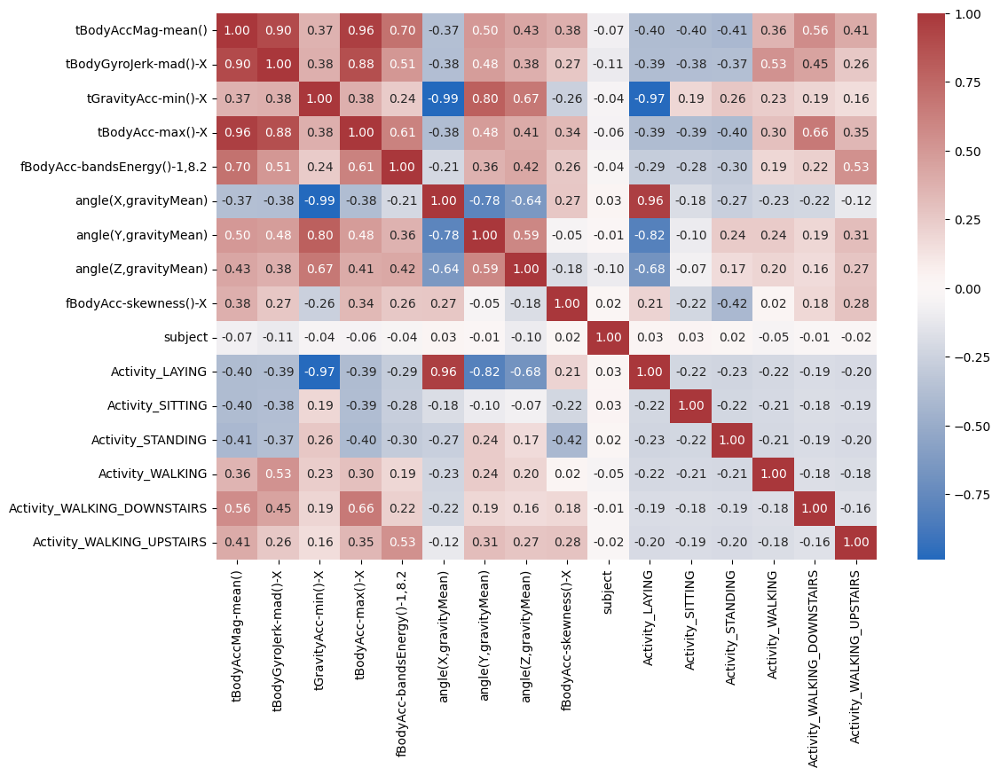

In [176]:
# ( ͡° ͜ʖ ͡°) your code here

# Применим One-Hot Encoding к столбцу Activity
train_encoded = pd.get_dummies(train, columns=['Activity'])
test_encoded = pd.get_dummies(test, columns=['Activity'])

correlation_matrix = train_encoded.corr()

display(correlation_matrix)

# вариант получше, более читабельный:
plt.figure(figsize=(12, 8)) 
sns.heatmap(correlation_matrix, cmap="vlag", annot=True, fmt="0.2f")
plt.show()

# По таблице корреляций признаков видно, что 
# усредненная величина ускорения тела сильно зависит от медианной величина рывка тела по оси Х (что логично) и максимальная величина ускорения тела по оси Х
# Также угол между осью Х и усредненной гравитационной составляющей ускорения показал обратную зависимость с минимумом гравитационной составляющей ускорения по оси Х
# Кроме того, минимум гравитационной составляющей ускорения по оси Х показал обратную корреляцию и с активностью "Лежать".
# Еще высокая корреляция с (углом между осью Х и усредненной гравитационной составляющей ускорения) и с активностью "Лежать".
# Также по тепловой карте явно видно, что номер подопытного subject вообще ни от чего не зависит, что тоже ясно логически.

Поздравляем! Вы предобработали данные для максимально комфортного их последующего анализа. Теперь вы готовы приступить к Exploratory Data Analysis!

## Exploratory Data Analysis

### Задание 5 (0.5 балла)

Вы проверили основную информацию о данных и составили свое первое впечатление о них. Теперь визуализации.

Начнем рисовать графики с небольшой разминки. Выберите две любые математические функции (отличные от линейной) и нарисуйте их на одном графике. Подпишите каждый из графиков, чтобы было понятно, какие функции вы выбрали. Ниже будет пример.

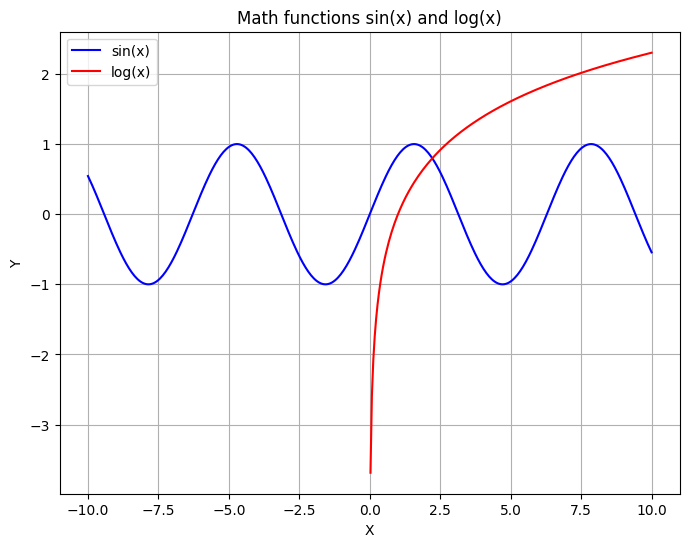

In [177]:
# (◕‿◕)♡ your code here

x = np.linspace(-10, 10, 400)

y_sin = np.sin(x)
y_cos = np.log(x)

plt.figure(figsize=(8, 6))

plt.plot(x, y_sin, label='sin(x)', color='blue')
plt.plot(x, y_cos, label='log(x)', color='red')

plt.title('Math functions sin(x) and log(x)')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(loc='best')
plt.grid(True)        

plt.show()

### Задание 6 (0.5 балла)

Ранее мы уже проверили сбалансированность данных по разным категориям активностей в train и test сетах. Теперь визуализируйте количество сэмплов в каждой из категорий отдельно для train и test сетов, как в примере ниже. Проследите, чтобы порядок категорий слева и справа был одинаков. Иначе не очень удобно их сравнивать (когда они в разных местах двух графиков). Также заметьте, что в примере ось Х в одинаковом масштабе, что тоже удобно для сравнения.

Вам может пригодиться:
- plt.barh или ax.barh

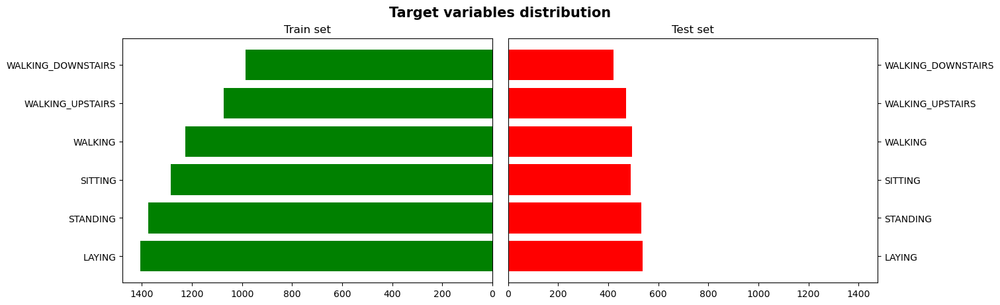

In [ ]:
# ̿' ̿'\̵͇̿̿\з=( ͡ °_̯͡° )=ε/̵͇̿̿/'̿'̿ ̿ your code here

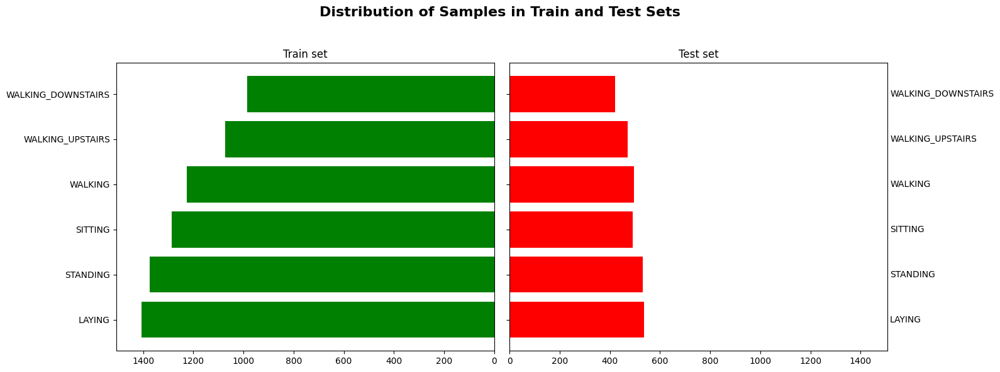

In [178]:
activity_counts_train_sorted = activity_counts_train.sort_values(ascending=False)
sorted_index = activity_counts_train_sorted.index

activity_counts_test_sorted = activity_counts_test.reindex(sorted_index)

all_categories = sorted_index

fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

max_count = max(activity_counts_train_sorted.max(), activity_counts_test_sorted.max())
axes[0].set_xlim(0, max_count + 100) 
axes[1].set_xlim(0, max_count + 100) 

axes[0].barh(all_categories, activity_counts_train_sorted, color='green')
axes[0].set_title('Train set')
axes[0].invert_xaxis()


bars_test = axes[1].barh(all_categories, activity_counts_test_sorted, color='red')
axes[1].set_title('Test set')

for i, category in enumerate(all_categories):
    axes[1].text(max_count + 110, i, category, ha='left', va='center')

plt.suptitle('Distribution of Samples in Train and Test Sets', fontsize=16, fontweight='bold')

plt.tight_layout(rect=[0, 0, 1, 0.95])  
plt.show()


Правда на таких графиках проще проверять баланс классов таргета?)

### Задание 7 (0.5 балла)

Ранее вы выводили таблицу корреляций. Однако просто таблица корреляций не очень удобна для анализа. Что, если признаков было бы больше? Визуализируйте heatmap корреляций. Подпишите значения корреляций, округленные до 2 знаков после запятой, на графике и оставьте только те значения, которые по модулю не меньше 0.5. Будем считать такие корреляции существенными. Если будете брать код из семинарского ноутбука, то поменяйте в нем что-нибудь, например, цветовую гамму, иначе проверяющий будет карать :)

Какой признак стоит исключить из рассмотрения корреляций? Напишите его название, а также причину, почему нет смысла его рассматривать.

Вам может пригодиться:
- sns.heatmap
- методы get_text и set_text у атрибута texts графика

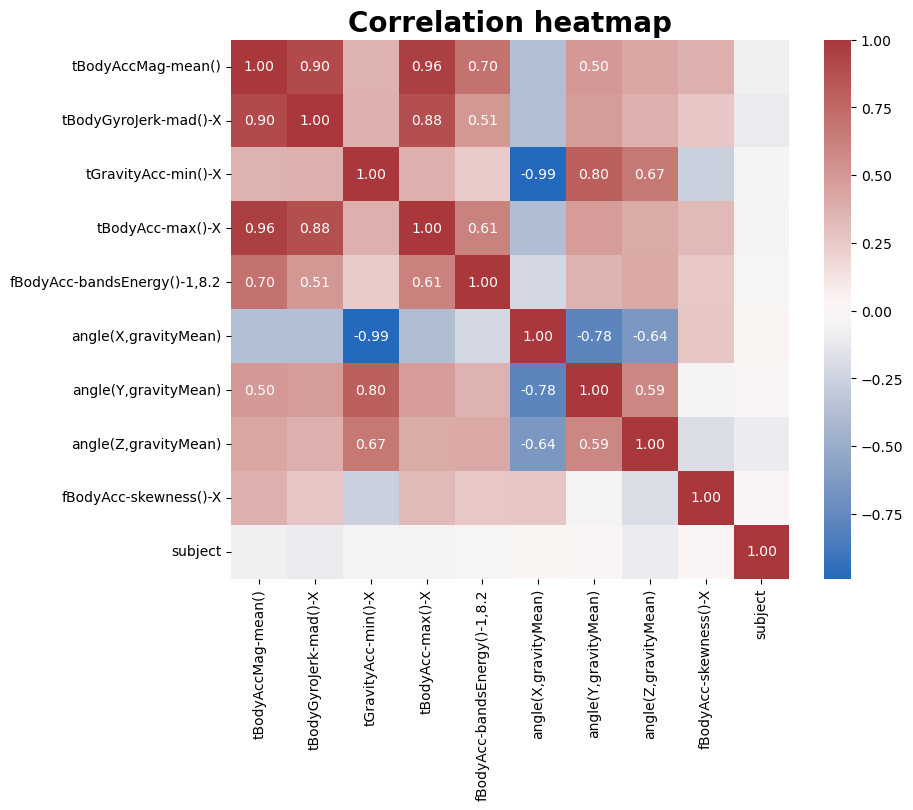

In [ ]:
# ღゝ◡╹)ノ♡ your code here (i left this cell to see the example :) )

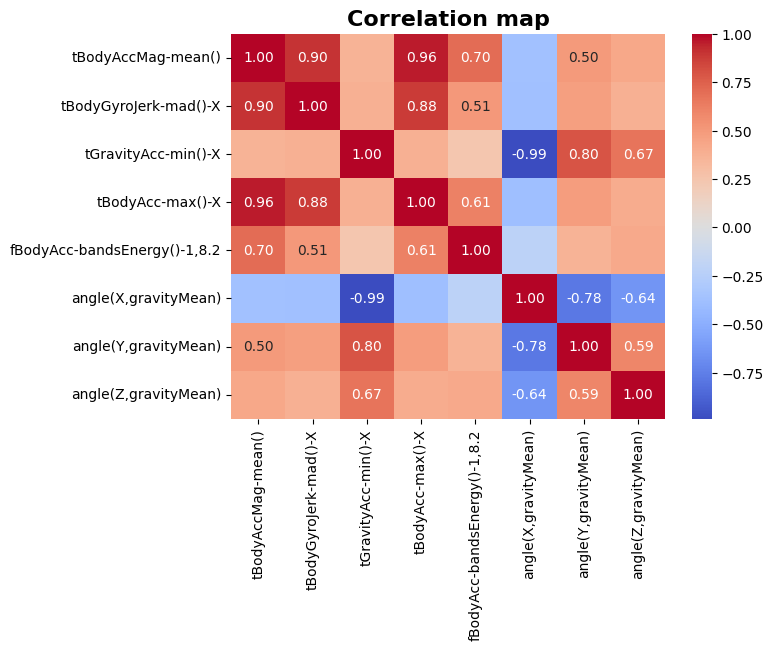

In [179]:
df_optimised = train.drop(columns=['subject', 'Activity', 'fBodyAcc-skewness()-X'])
plt.figure(figsize=(7, 5)) 

correlation_matrix_optimised = df_optimised.corr()

ax = sns.heatmap(correlation_matrix_optimised, cmap="coolwarm", annot=True, fmt="0.2f")
for t in ax.texts:
    if float(t.get_text()) >= 0.5 or float(t.get_text()) <= -0.5:
        t.set_text(t.get_text())
    else:
        t.set_text("")
        
plt.title("Correlation map", fontweight='bold', fontsize=16)
       
plt.show()       
        
# из таблицы корреляций можно исключить признак subject, потому что он точно никак не зависит ни от какого из других признаков.
# это просто порядковые номера людей, тем более на корреляционной таблице выше уже видно, что это бесполезный здесь признак.

# также можно исключить fBodyAcc-skewness()-X, так как в соответствии с данным заданием и судя по таблице корреляций,
# этот признак не сильно зависит от остальных, все его значения по модулю меньше 0,5.

### Задание 8 (0.5 балла)

Для начала будем стрелять из пушки по воробьям. Выведите pairplot по всем данным train сета. Напишите, заметили ли вы в нем что-нибудь интересное, чего не было в таблицах и графиках ранее, а также сообщите, было ли вам удобно анализировать 100 графиков.

In [180]:
unique_count = train['subject'].nunique()
print("Количество уникальных значений в subject:", unique_count)

unique = train['subject'].unique()
print("Уникальные значения в subject:", unique)
 

Количество уникальных значений в subject: 21
Уникальные значения в subject: [ 1  3  5  6  7  8 11 14 15 16 17 19 21 22 23 25 26 27 28 29 30]


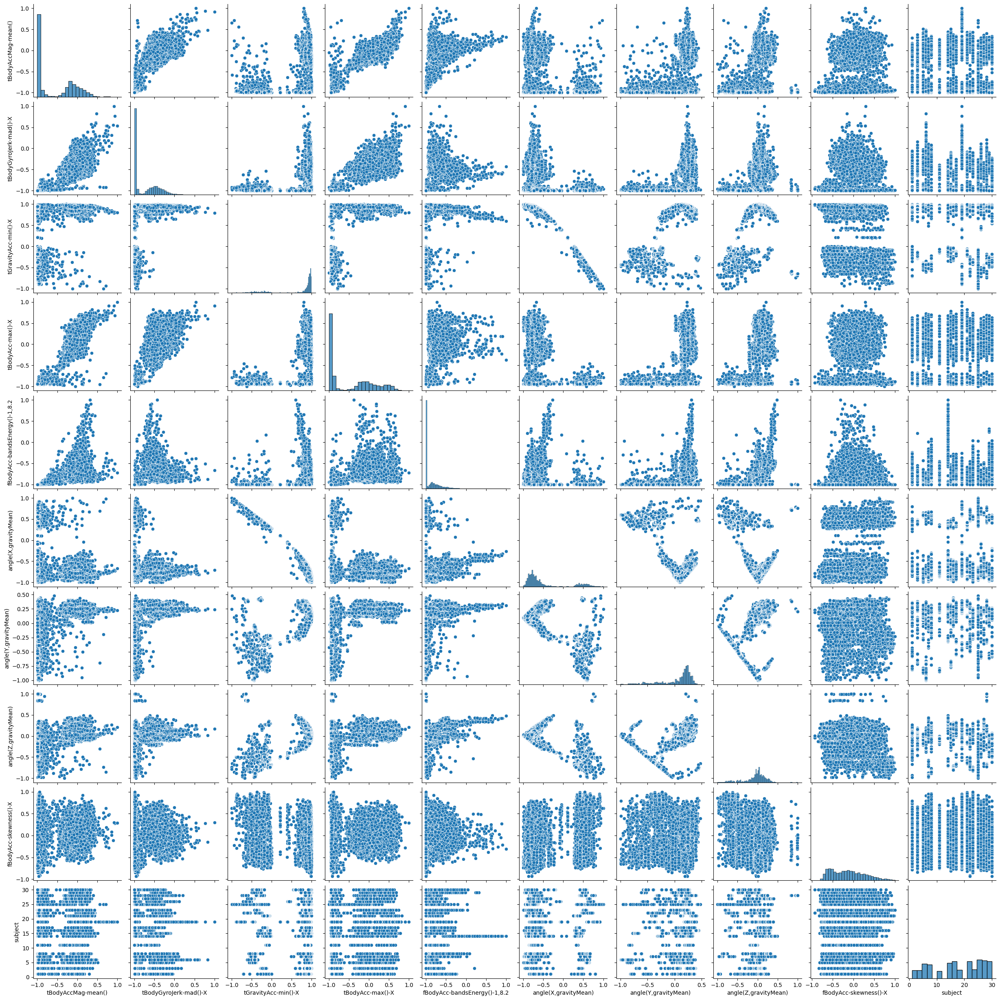

In [181]:
# ♪ヽ( ⌒o⌒)人(⌒-⌒ )v ♪ your code here

sns.pairplot(train)
plt.show()

# конечно, pairplot крут тем, что позволяет под лупой посмотреть на зависимости 
# всех возможных пар. Из интересного: многие графики здесь можно просто не смотреть, так как они
# плохие и не дают особо информации. Например, все графики, которые связаны с subject, можно удалить.
# Но даже в subject-subject меня удивило то, что там есть пустые столбцы, хотя по идее в эксперименте участвовало 30
# человек и пропусков не было. Странно. Upd: проверила в ячейке выше, действительно, некоторые номера пропущены,
# и в describe при 50% не 15, а 19, так что можно сделать вывод, что данные о некоторых испытуемых (о девяти) не дошли.

# Также у многих данных сильный уход в отрицательные значения (об этом говорят выраженные столбцы-выбросы в диагональных графиках)

# Остальные графики просто можно интуитивно порассматривать и попыытаться соотнести их изображение с характеристикой, которую
# они описывают. Так, данные об углах (angle...) обладают похожим паттерном - 
# некоторым "углом" на графике. В то время как такие метрики, как ускорение и рывок
# более "размазаны", ведь в выборке люди делали разные движения.
# Кстати, возможно, что если бы мы строили pairplot по данным, характеризующим только одно действие,
# например все, у которых в Activity значение STANDING, то у графиков можно было бы
# еще лучше визуально рассмотреть какой-то рисунок, характеризующий это действие. И так по всем признакам.

# Ну и очевидное замечание - да, на графиках, соответствующих местам в таблице корреляций,
# где зависимость высокая, видно визуально, что действительно есть какая-то зависимость.

# Честно говоря, не удобно было не только анализировать, а постоянно скроллить в разные части ноутбука,
# чтобы посмотреть на данные, вспомнить названия метрик, что они означают и так далее. График приходилось постоянно увелияивать.
# Но я думаю, что это не критичная проблема и скоро я привыкну.

### Задание 9 (1 балл)

Окей. Смотреть на все сразу не очень удобно. Кажется, нужно смотреть на признаки в отдельности и искать в них инсайты.

Попробуем проверить гипотезу. Отобразите плотность распределения (kde) `tBodyAccMag-mean()` для каждой из активностей, как в примере ниже. Видите закономерность? Можно ли поделить все активности на две группы? Если да, то проведите вертикальную линию, которая визуально неплохо разделяет эти группы.

Давайте первую группу называть статическими активностями, а вторую - динамическими.

Посчитайте, какую долю правильных ответов дает ваша вертикальная линия для разделения именно этих двух групп. С чем может быть связан полученный вами результат? Предположите логическое обоснование (почему именно данный признак так хорошо/плохо разделяет группы активностей).

Вам может пригодиться:
- sns.kdeplot

In [182]:
unique = train['Activity'].unique()
print("Уникальные:", unique)

Уникальные: ['STANDING' 'SITTING' 'LAYING' 'WALKING' 'WALKING_DOWNSTAIRS'
 'WALKING_UPSTAIRS']


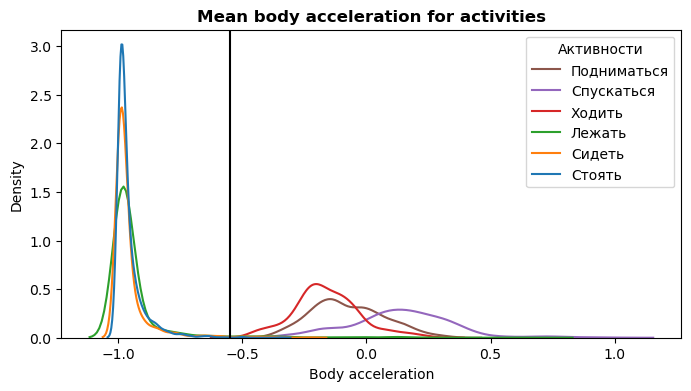

In [ ]:
# ʅ(◔౪◔ ) ʃ your code here

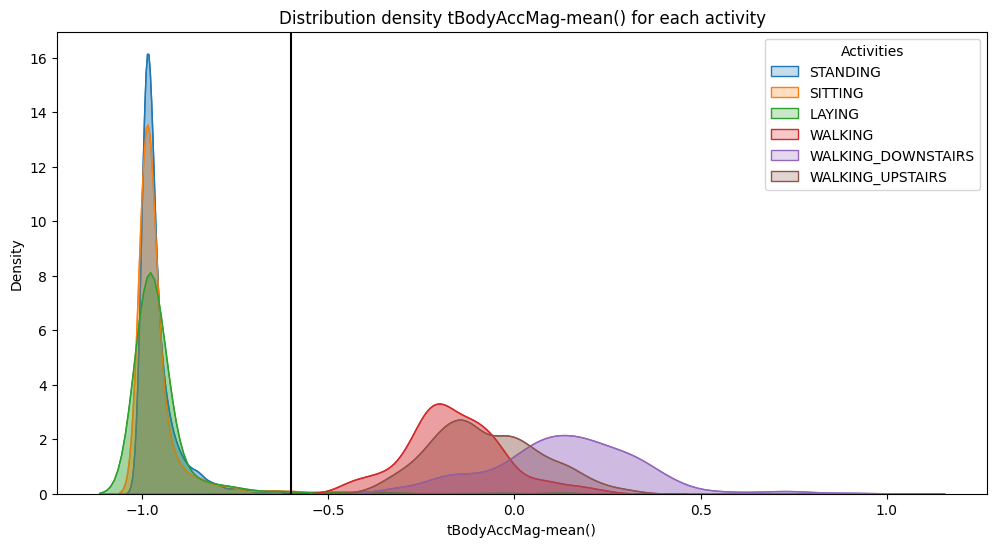

Доля правильных ответов: 0.99


In [183]:
plt.figure(figsize=(12, 6))
sns.kdeplot(data=train, x='tBodyAccMag-mean()', hue='Activity', fill=True, common_norm=False)

for activity in train['Activity'].unique():
    sns.kdeplot(data=train[train['Activity'] == activity], 
                x='tBodyAccMag-mean()', 
                label=activity, 
                fill=True, 
                common_norm=False)

plt.axvline(x=-0.6, color='black', linestyle='-')
plt.title('Distribution density tBodyAccMag-mean() for each activity')
plt.xlabel('tBodyAccMag-mean()')
plt.ylabel('Density')
plt.legend(title='Activities', loc='upper right')

plt.show()

static_activities = ['SITTING', 'STANDING', 'LAYING']
dynamic_activities = ['WALKING', 'WALKING_DOWNSTAIRS', 'WALKING_UPSTAIRS']

train['Predicted_Group'] = train['tBodyAccMag-mean()'].apply(lambda x: 'Static' if x <= -0.6 else 'Dynamic')

correct_predictions = train['Activity'].apply(lambda x: 'Static' if x in static_activities else 'Dynamic')

accuracy = (train['Predicted_Group'] == correct_predictions).mean()

print(f"Доля правильных ответов: {accuracy:.2f}")


# Данный результат связан с тем, что усредненная величина ускорения тела
# очень зависит от того, какой тип у движений. Понятно, что если это статичное действие,
# то и ускорения не будет никакого. А если динамичное - то наоборот. Поэтому этот признак так хорошо делит групппы активностей - 
# процент успеха - 99%!

### Задание 10 (0.5 балла)

Поздравляем, вы проверили первую гипотезу в процессе EDA. Однако нам бы хотелось уметь не группы разделять, а каждый отдельный вид активности. Попробуйте нарисовать "ящики с усами" для `angle(X,gravityMean)` с разделением по разным видам активности на данных train. Можно ли сделать какой-то вывод по полученной визуализации? Проанализируйте и проинтерпретируйте полученные картинки (если заметили какую-то особенность, может какая-то категория значительно выделяется, то предположите, почему так могло произойти).

Вам может пригодиться:
- sns.boxplot

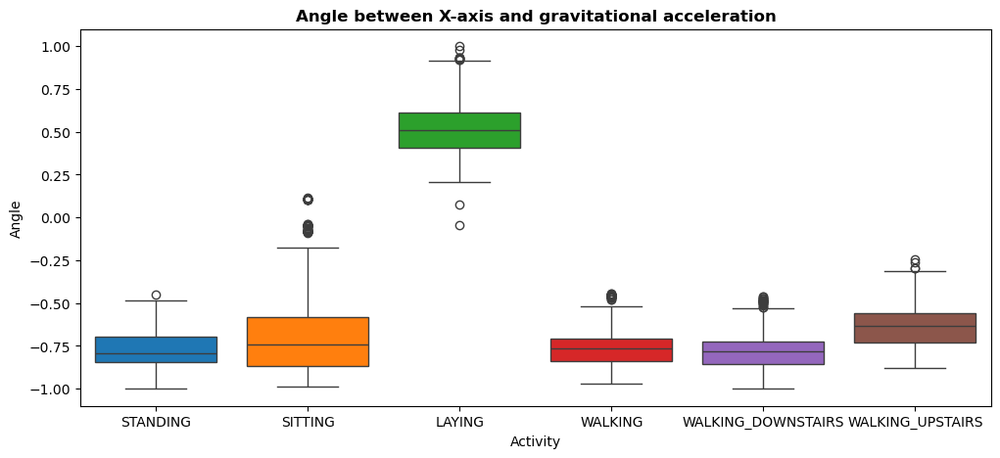

In [ ]:
# ^⨀ᴥ⨀^ your code here

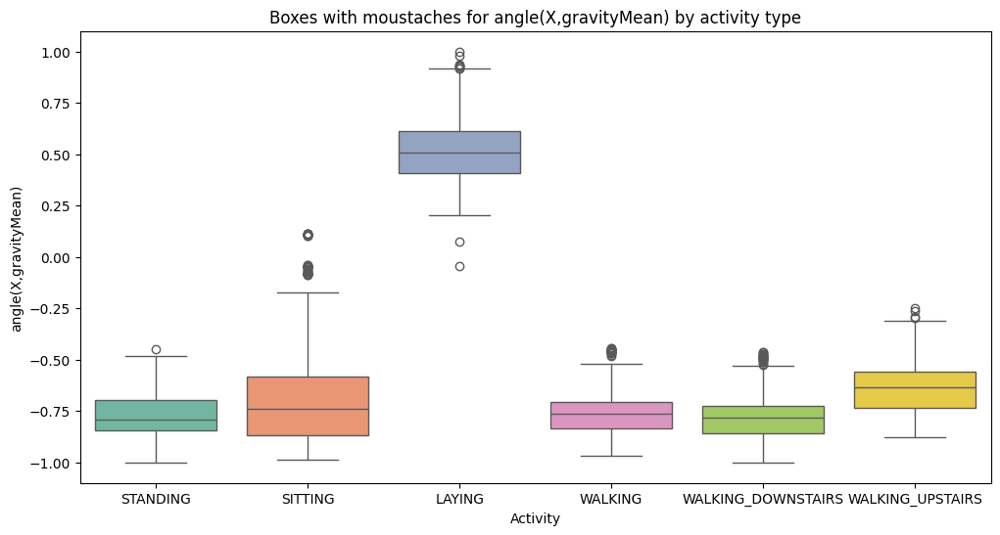

In [184]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=train, x='Activity', y='angle(X,gravityMean)', palette='Set2')

plt.title('Boxes with moustaches for angle(X,gravityMean) by activity type')
plt.xlabel('Activity')
plt.ylabel('angle(X,gravityMean)')

plt.show()

# По данной визуализации можно сделать вывод о том, что угол между осью Х и усредненной гравитационной составляющей ускорения
# очень хорошо выделяет активность "Лежать". Действительно, когда человек находится в положении лёжа,
# угол между телом и направлением силы тяжести становится максимальным (стремится к 90 градусам, если мне не изменяют
# мои воспоминания о физике), что отражается в сильно отличающихся положительных значениях angle(X,gravityMean) в категории LAYING.

# Также можно увидеть, что в SITTING есть много выбросов. Возможно, у разных людей были разные кресла, у которых был разный угол наклона
# спинки или же они постоянно качали корпусом.

### Задание 11 (0.5 балла)

Посмотрим теперь на `tBodyAcc-max()-X`. Визуализируйте скрипичные диаграммы для этого признака с разделением по активностям на всем train. Кажется логичным, что максимальное ускорение в моменте для разных активностей будет различаться. Однако есть ли активность, которая будет выделяться? Если да, то предложите объяснение, почему эта активность выделяется.

Вам может пригодиться:
- sns.violinplot

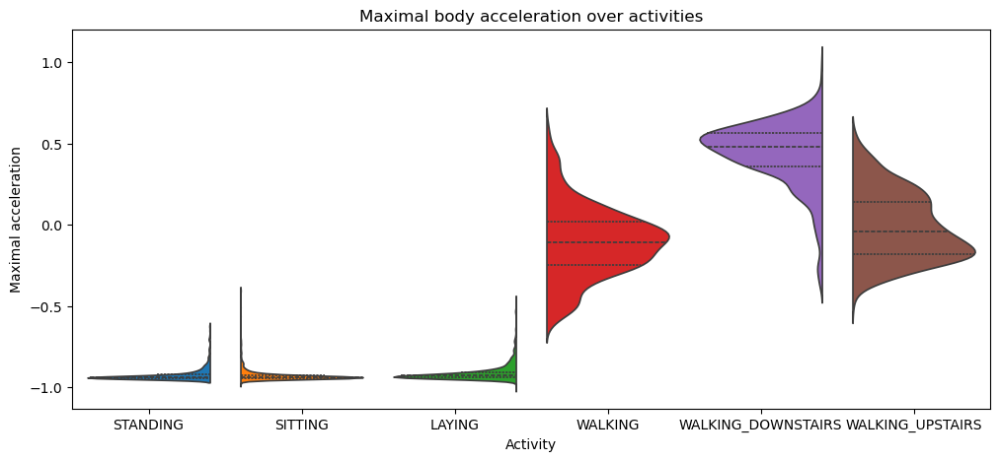

In [ ]:
# ( ͡☉ ͜ʖ ͡☉) your code here

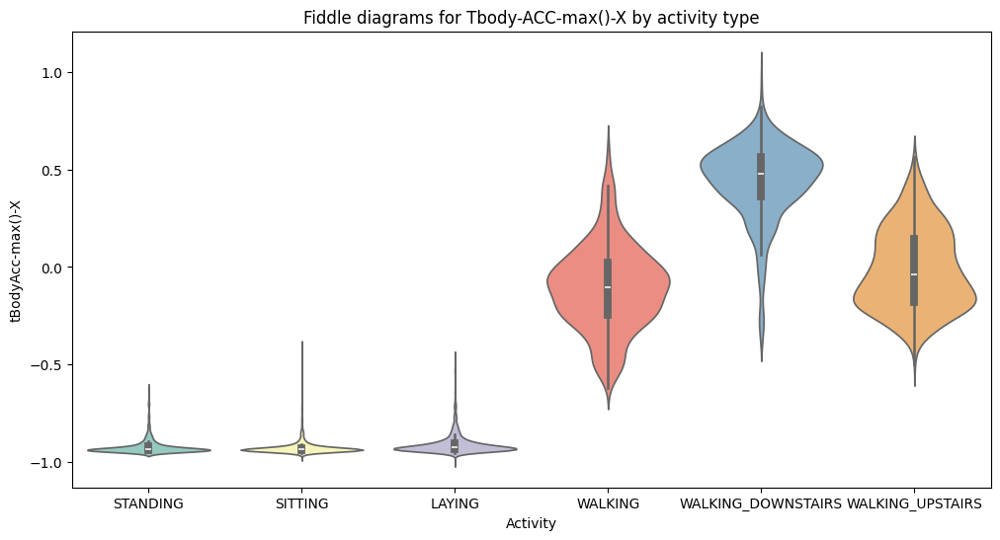

In [185]:
# максимальная величина ускорения тела по оси Х

plt.figure(figsize=(12, 6))
sns.violinplot(data=train, x='Activity', y='tBodyAcc-max()-X', palette='Set3',  bw='silverman')

plt.title('Fiddle diagrams for Tbody-ACC-max()-X by activity type')
plt.xlabel('Activity')
plt.ylabel('tBodyAcc-max()-X')

plt.show()

# меня немного смущает, что в примере графики совсе не похожи на violinplot. Но я делаю как в подсказке в задании
# и считаю, что в целом эти графики ничем не отличаются. Просто в вашем примере лучше видно медиану и квартили
# и нет повторений (в скрипичном графике две стороны симметричны).

# Судя по результатам violinplot, могу сделать вывод о том, что статичные виды активности 
# очень схожи друг с другом по данному признаку. 
# Действительно, максимальная величина ускорения тела по оси Х
# на графике около -1, так как человек находится в статичном положении и понятно, что никакого ускорения нет.
# Что касается активных видов деятельности, то здесь поинтереснее.
# У ходьбы распределение +- равномерное и медиана находится около 0, это можно обосновать тем, что
# при ходьбе человек двигается более-менее спокойно, без явных ускорений. Спуск и подъём в этом плане отличаются.
# У спуска значения максимальные среди всех категорий, а мода находится около 0.6, что очень много. 
# У подъема ситуация еще более интересная. Медиана чуть больше, чем у ходьбы и есть два докальных экстремума.
# Могу предположить, что это обосновано тем, что в разные эксперименты могли проходить на лестницах разного угла наклона.

### Задание 12 (1 балл)

Вы уже можете с довольно хорошим качеством выделить две категории активности из шести. Продолжим.

Ранее уже упоминалось разделение на две группы активностей: статические и динамические. Пришла пора разделить датасет train на две части. Сделайте это! Теперь на одной картинке покажите распределения `fBodyAcc-bandsEnergy()-1,8.2` для динамичных активностей (`boxenplot` - немного измененый "ящик с усами") и `angle(Y,gravityMean)` для статических - тут хватит и простой гистограммы (прямо, как в примере ниже). Можно ли выделить еще какие-то активности? Если да, напишите, какие активности на 1 и 2 графиках выделяются.

Вам может пригодиться:
- plt.subplots или matplotlib.gridspec (заметили, что один график больше другого? попробуйте сами так сделать - вам понравится...)
- sns.boxenplot
- sns.histplot

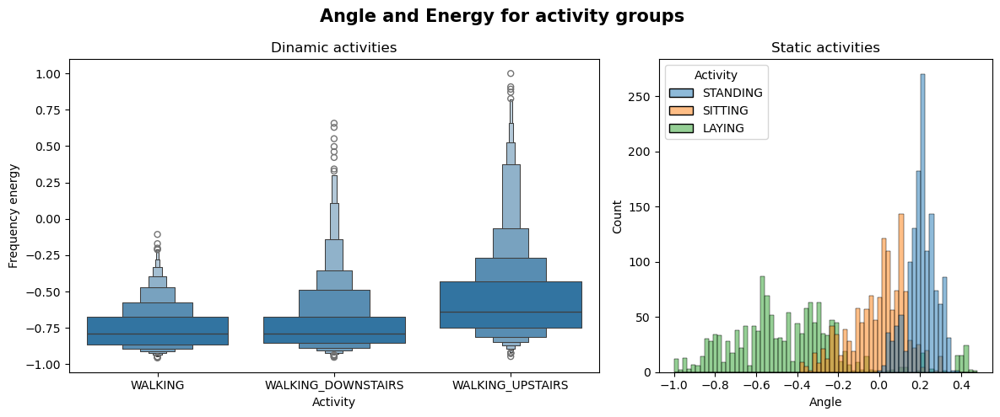

In [ ]:
# ‿( ́ ̵ _-`)‿ your code here

In [190]:
df_static['Activity'].unique()

array(['STANDING', 'SITTING', 'LAYING'], dtype=object)

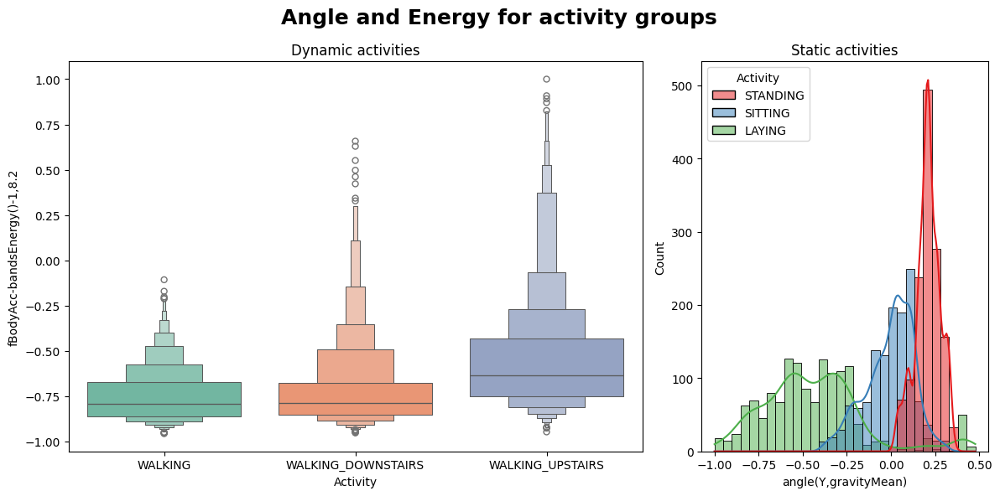

In [208]:
df_static = train[train['Activity'].isin(static_activities)]
df_dynamic = train[train['Activity'].isin(dynamic_activities)]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), gridspec_kw={'width_ratios': [2, 1]})


sns.boxenplot(data=df_dynamic, x='Activity', y='fBodyAcc-bandsEnergy()-1,8.2', ax=ax1, palette='Set2')
ax1.set_title('Dynamic activities')
ax1.set_xlabel('Activity')
ax1.set_ylabel('fBodyAcc-bandsEnergy()-1,8.2')

sns.histplot(data=df_static, x='angle(Y,gravityMean)', hue='Activity', ax=ax2, bins=30, kde=True, palette='Set1', multiple='layer')
ax2.set_title('Static activities')
ax2.set_xlabel('angle(Y,gravityMean)')
ax2.set_ylabel('Count')

plt.suptitle("Angle and Energy for activity groups", fontweight='bold', fontsize=18)

plt.tight_layout()
plt.show()

# Да, здесь можно выделить активности. Например, на шрафике динамических активностей
# выделяется WALKING. У него разброс значений рассматриваемого признака fBodyAcc-bandsEnergy()-1,8.2
# энергия частоты тела не такой большой, как у двух других,
# потому что это просто ходьба, что логично. Кстати, подъем и спуск тоже
# отличаются, подъем охватывает больше положительных значений, его мода выше моды у спуска и больше выбросов в
# значениях около единицы.
# На графике статичных активностей выделяется STANDING.
# У него значения угла между осью Y и усредненной гравитационной составляющей ускорения
# сконцентрированы в области 0.2, что указывает на вертикальное положение тела человека.
# Так, активность LAYING наоборот, сильно уходит в отрицательные значения.


### Задание 13 (0.5 балла)

Не всегда жизнь будет такой легкой, а данные будут полностью или почти линейно разделимы в одному признаку (иначе чем бы занимались дата саентисты...). Часто данные вообще ни по одному признаку нельзя адекватно разделить (да и по комбинациям признаков тоже). Давайте попробуем взять не один признак, а целых два!

Рассмотрим только статические активности. Будет снова два графика сразу. На первом графике будет боксплот распределения `fBodyAcc-skewness()-X` по активностям. А на втором попробуем взять не все наблюдения данной группы активностей, а только их часть. Разделимы ли категории по `fBodyAcc-skewness()-X`? А если взять только те строки, где `fBodyAcc-skewness()-X < -0.376`, и теперь вывести боксплот распределения `angle(Y,gravityMean)` по разным активностям? Попробуйте и напишите, выделилась ли какая-то категория?

Вам может пригодиться:
- plt.subplots или matplotlib.gridspec
- sns.boxplot

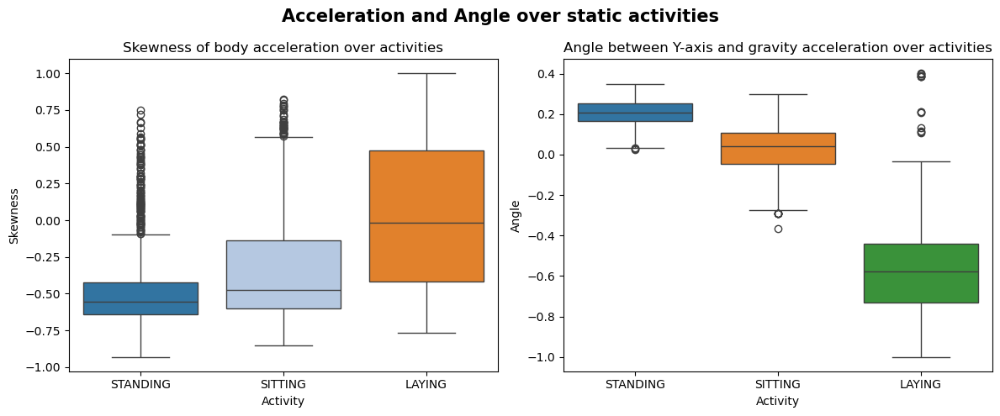

In [ ]:
# (ಠ_ಠ) your code here

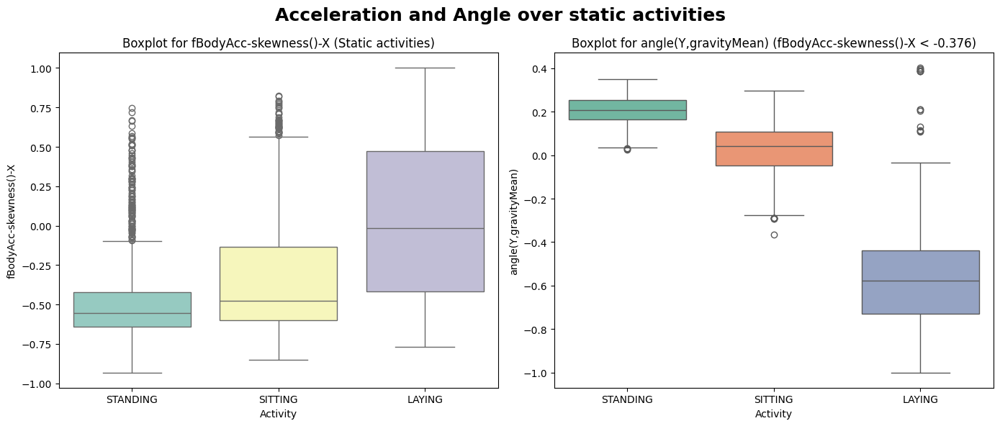

In [221]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
plt.suptitle("Acceleration and Angle over static activities", fontweight='bold', fontsize=18)
ax1.set_title('Boxplot for fBodyAcc-skewness()-X (Static activities)')
sns.boxplot(data=df_static, x='Activity', y='fBodyAcc-skewness()-X', ax=ax1, palette='Set3')

df_filtered = df_static[df_static['fBodyAcc-skewness()-X'] < -0.376]

sns.boxplot(data=df_filtered, x='Activity', y='angle(Y,gravityMean)', ax=ax2, palette='Set2')
ax2.set_title('Boxplot for angle(Y,gravityMean) (fBodyAcc-skewness()-X < -0.376)')
plt.tight_layout()

plt.show()

# Категории по fBodyAcc-skewness()-X не особо разделимы. Да, у LAYING диапазон значений больше, 
# но это все равно не помогает выделить четко категорию.
# Если взять только строки, где fBodyAcc-skewness()-X < -0.376 и вывести боксплот по angle(Y,gravityMean), то
# можно заметить, что категория LAYING теперь отчетливо выделилась и показала, что по данным параметрам 
# она находится строго в отрицательных значениях, в отличие от двух других статических активностей. Конечно же не считая выбросов.

Поздравляем, теперь вы на шажок ближе к тому, чтобы стать решающим деревом!

### Задание 14 (1 балл)

Вот и осталась лишь одна активность, которую мы никак не выделили. Попробуем и ее какими-то порогами отделить от всех остальных. Да, можно было бы сказать, что, раз уж мы выделили 5 из 6 категорий, то все остальное - это и есть последняя категория, но мы не идем легкими путями. Выделить оставшуюсь категорию с хорошим качеством не так уж и просто. Из доступных признаков, сначала посмотрите на распределение `tBodyAcc-max()-X` на динамических активностях (скрипичная диаграмма отлично подойдет).

А теперь спускаем вам порог `tBodyAcc-max()-X < 0.157`. Для таких строк постройте диаграмму рассеяния для признака `tGravityAcc-min()-X`. Да, получается неидеально, но это честная работа. Можно выбрать порог так, чтобы чисто из таблицы с динамическими активностями из строк, где `tBodyAcc-max()-X < 0.157`, выбрать по некоторому порогу для `tGravityAcc-min()-X` строки так, чтобы доля правильных ответов на оставшейся категории была не меньше 83%!

Вам может пригодиться:
- plt.subplots или matplotlib.gridspec
- sns.violinplot
- sns.swarmplot (иногда лучше подходит, чем просто sns.scatterplot)

Обратите внимание, что подписи к осям можно убирать методами plt. Например, если у вас общее название для оси Y для обоих графиков, то можно не подписывать ось Y у второго графика.

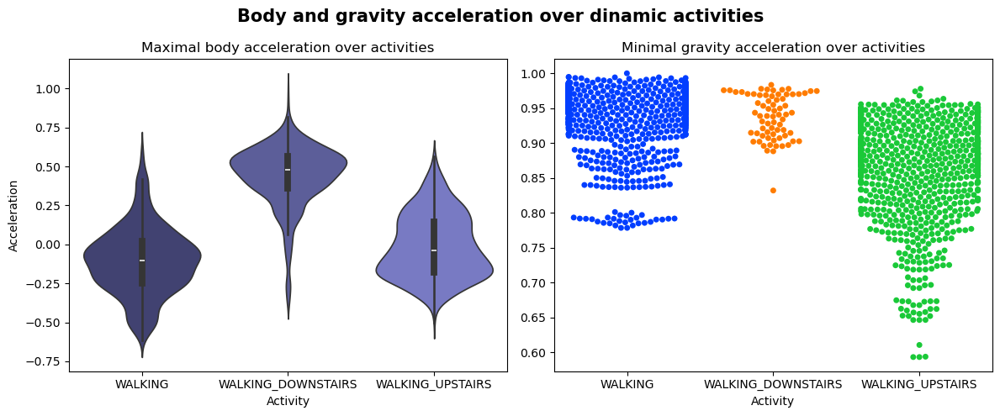

In [ ]:
# (✖╭╮✖) your code here

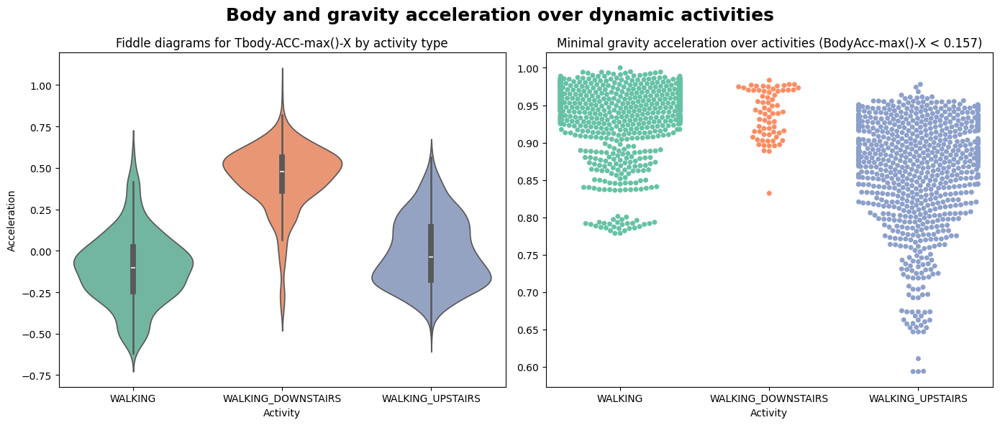

In [282]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
plt.suptitle("Body and gravity acceleration over dynamic activities", fontweight='bold', fontsize=18)
sns.violinplot(data=df_dynamic, x='Activity', y='tBodyAcc-max()-X', ax=ax1, palette='Set2',  bw='silverman')
ax1.set_title('Fiddle diagrams for Tbody-ACC-max()-X by activity type')
ax1.set_ylabel('Acceleration')

df_dynamic_filtered = df_dynamic[df_dynamic['tBodyAcc-max()-X'] < 0.157]

sns.swarmplot(data=df_dynamic_filtered, x='Activity', y='tGravityAcc-min()-X', ax=ax2, palette='Set2')
ax2.set_title('Minimal gravity acceleration over activities (BodyAcc-max()-X < 0.157)')
ax2.set_ylabel('')
plt.tight_layout()
plt.show()

In [292]:
threshold = 0.9258
df_dynamic_filtered['Predicted_Group'] = df_dynamic_filtered['tGravityAcc-min()-X'].apply(lambda x: 'Walking_Upstairs' if x <= threshold else 'Not wal_upst')

correct_predictions = df_dynamic_filtered['Activity'].apply(lambda x: 'Walking_Upstairs' if x == 'WALKING_UPSTAIRS' else 'Not wal_upst')

accuracy = (df_dynamic_filtered['Predicted_Group'] == correct_predictions).mean()

print(f"Доля правильных ответов: {accuracy:.2f}")


Доля правильных ответов: 0.80


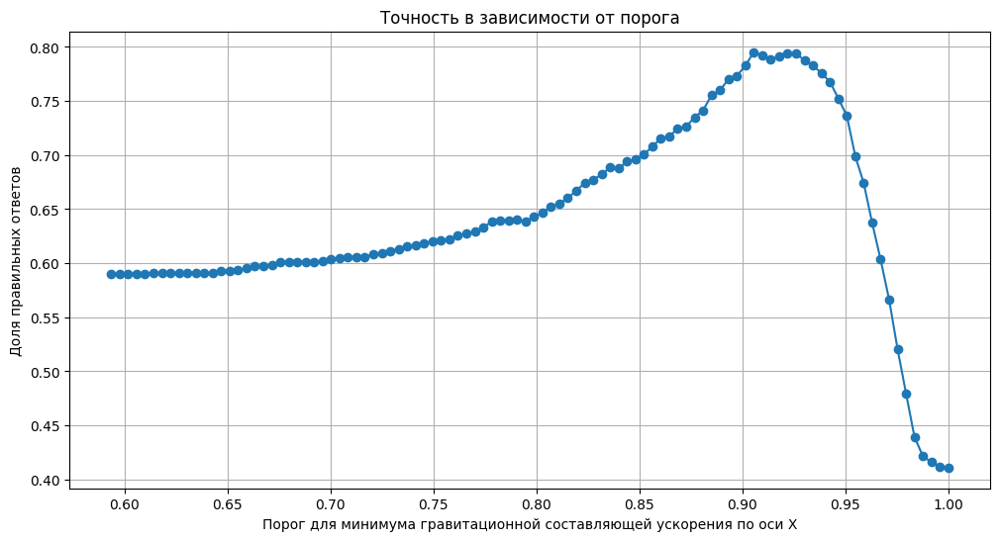

Оптимальный порог: 0.91, максимальная точность: 0.80


In [295]:
thresholds = np.linspace(df_dynamic_filtered['tGravityAcc-min()-X'].min(), 
                         df_dynamic_filtered['tGravityAcc-min()-X'].max(), 
                         100)
accuracies = []

for threshold in thresholds:
    df_dynamic_filtered['Predicted_Group'] = df_dynamic_filtered['tGravityAcc-min()-X'].apply(
        lambda x: 'Walking_Upstairs' if x <= threshold else 'Not wal_upst'
    )
    
    correct_predictions = df_dynamic_filtered['Activity'].apply(
        lambda x: 'Walking_Upstairs' if x == 'WALKING_UPSTAIRS' else 'Not wal_upst'
    )
    
    accuracy = (df_dynamic_filtered['Predicted_Group'] == correct_predictions).mean()
    accuracies.append(accuracy)

    
plt.figure(figsize=(12, 6))
plt.plot(thresholds, accuracies, marker='o')
plt.title('Точность в зависимости от порога')
plt.xlabel('Порог для минимума гравитационной составляющей ускорения по оси Х')
plt.ylabel('Доля правильных ответов')
plt.grid()
plt.show()


optimal_threshold = thresholds[np.argmax(accuracies)]
max_accuracy = max(accuracies)

print(f"Оптимальный порог: {optimal_threshold:.2f}, максимальная точность: {max_accuracy:.2f}")

### Задание 15 (0.5 балла)

Теперь попробуем более интерактивные графики. Установите библиотеку `plotly` (обычно `pip install plotly` или `conda install plotly`). Синтаксис очень похож на `seaborn`, но вот [документация для plotly.express](https://plotly.com/python-api-reference/plotly.express.html).

Сначала подготовим данные для визуализации. Будем считать t-SNE просто "черным ящиком", который принимает наши данные и проецирует их в двумерное или трехмерное пространство. Возможно, придется немного подождать.

In [16]:
!pip install -U plotly



[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [7]:
%%time
from sklearn.manifold import TSNE
tsne = TSNE(random_state=666, n_components=2)
print("First_step")
new = tsne.fit_transform(train.drop(['subject', 'Activity'], axis=1))
print("Second_step")
df_2_comp = pd.concat([
    pd.DataFrame(new, columns=['x', 'y']),
    train['Activity']
], axis=1)

tsne = TSNE(random_state=666, n_components=3)
print("Third_step")
new = tsne.fit_transform(train.drop(['subject', 'Activity'], axis=1))
print("Forth_step")
df_3_comp = pd.concat([
    pd.DataFrame(new, columns=['x', 'y', 'z']),
    train['Activity']
], axis=1)

First_step
Second_step
Third_step
Forth_step
CPU times: total: 6min 18s
Wall time: 7min 30s


Теперь нарисуйте scatter-график через `plotly.express` для `df_2_comp` с выделением цветами активностей. Красиво получилось? Видны скопления точек одного цвета? Можно разные активности отделить линиями на данном графике?

In [8]:
import plotly.express as px


# Построение scatter-графика
fig = px.scatter(
    df_2_comp, x='x', y='y', 
    color='Activity',  
    title="t-SNE Visualization of Activities",
    labels={'x': 't-SNE Component 1', 'y': 't-SNE Component 2'},
    opacity=0.7,
    width=900, height=600
)

fig.show()  


Мы не отстаем от трендов и тоже можем в 3D. Сейчас и вы научитесь (если еще не умеете). Нарисуйте scatter_3d-график через `plotly.express` для `df_3_comp` с выделением цветами активностей. Повращайте его. Нормально получилось? Есть ли какая-то структура у точек?

In [9]:
# (✧≖‿ゝ≖) your code here
import plotly.express as px

# Убираем возможные NaN
df_3_comp = df_3_comp.dropna()

fig = px.scatter_3d(
    df_3_comp, x='x', y='y', z='z', 
    color='Activity',  
    title="3D t-SNE Visualization of Activities",
    labels={'x': 't-SNE Component 1', 'y': 't-SNE Component 2', 'z': 't-SNE Component 3'},
    opacity=0.7,  # Чуть прозрачности, чтобы не было перегрузки
    width=900, height=700
)

fig.show()


### Задание 16 (1 балл)

Мы сделали вам fit. Ваша очередь сделать predict. Допишите функцию, которая принимает на вход датафрейм с признаками, а выдает вектор из предсказаний - для каждой строки датафрейма вы определяете, к какому классу принадлежит объект. Рекомендуем сразу записывать из строками, а не кодировать в числа. Дальше фукнция `accuracy_score` выдаст вам долю правильных ответов.

Подсказка: вы уже отделили категории друг от друга по каким-то признакам. Воспользуйтесь этим знанием! Используя только проведенный вами анализ можно спокойно выбить не менее 75% на train и test! Если вы получите меньше 75%, то балл будет снижен. Авторское решение (на основе всех графиков выше) выбивает 81% и 77% на train и test соответственно. [Шпаргалка с готовыми идеями для такой задачи](https://rutube.ru/video/f884aa6ed5f94120b7304506042fe5bb/)

In [120]:
def predict(df: pd.DataFrame):
    predictions = []  

    for _, row in df.iterrows():
        if row['tBodyAccMag-mean()'] < -0.6:
            if row['angle(X,gravityMean)'] > 0.25 and (row['fBodyAcc-bandsEnergy()-1,8.2'] <= -0.2) or row['angle(Y,gravityMean)'] < -0.4 or row['fBodyAcc-skewness()-X'] < -0.376 and row['angle(Y,gravityMean)'] < -0.4:
                predictions.append('LAYING') 
            elif ((row['fBodyAcc-bandsEnergy()-1,8.2'] > 0.15) and (row['fBodyAcc-bandsEnergy()-1,8.2'] < 0.35)) or (row['tBodyAcc-max()-X'] < 0.157 and row['angle(Y,gravityMean)'] > 0.1):
                predictions.append('STANDING')
            elif (row['fBodyAcc-skewness()-X'] < -0.376 and (row['angle(Y,gravityMean)'] > -0.3 and row['angle(Y,gravityMean)'] < 0.3)) or (row['tBodyAcc-max()-X'] < 0.157 and row['angle(Y,gravityMean)'] > -0.1 and row['angle(Y,gravityMean)'] <= 0.1):
                predictions.append('SITTING')
            else:
                predictions.append('SITTING')

        else:
            if (row['tBodyAcc-max()-X'] > 0.2): 
                predictions.append('WALKING_DOWNSTAIRS')
            elif ((row['tBodyAcc-max()-X'] < 0.157 and row['tGravityAcc-min()-X'] <= 0.9258)) and ((-0.9 < row['fBodyAcc-bandsEnergy()-1,8.2'] and row['fBodyAcc-bandsEnergy()-1,8.2'] <= 0.95)):
                predictions.append('WALKING_UPSTAIRS')
            elif row['fBodyAcc-bandsEnergy()-1,8.2'] < -0.20:
                predictions.append('WALKING')
            else:
                predictions.append('WALKING')

    return np.array(predictions)
        

def accuracy_score(y_true, y_pred) -> float:
    y_true = np.asarray(y_true).reshape(-1, 1)
    y_pred = np.asarray(y_pred).reshape(-1, 1)
    return (y_true == y_pred).mean()

In [121]:
train_preds = predict(train)
test_preds = predict(test)
print(f"Accuracy on train set => {round(accuracy_score(train['Activity'], train_preds) * 100, 2)} %")
print(f"Accuracy on test set => {round(accuracy_score(test['Activity'], test_preds) * 100, 2)} %")

Accuracy on train set => 81.64 %
Accuracy on test set => 76.59 %


__Место для мема и/или фидбэка__

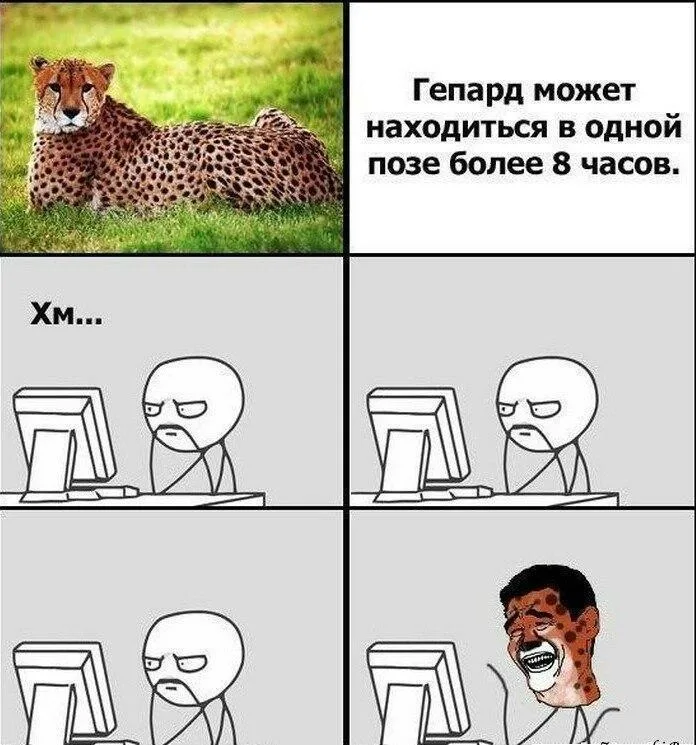